In [1]:
import numpy as np
import matplotlib

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
	
# Set such that PDF fonts export in a manner that they
# are editable in illustrator/affinity
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# set to define axes linewidths
matplotlib.rcParams['axes.linewidth'] = 0.5

# this defines some prefactors so inline figures look nice
# on a retina macbook. These can be commented out without any
# issue and are solely asthetic.
%matplotlib inline
%config InlineBackend.figure_format='retina'

# UPDATE 2020-12-31 (my preferred font is Avenir...)
font = {'family' : 'avenir',
    	'weight' : 'normal'}

matplotlib.rc('font', **font)

from tqdm import tqdm
import pickle
from sparrow import Protein
import protfasta

In [2]:
from shephard.apis import uniprot
from shephard.interfaces import si_domains, si_protein_attributes

from finches import Mpipi_frontend, CALVADOS_frontend
mf = Mpipi_frontend()
cf = CALVADOS_frontend()

/Users/alex/Dropbox/WASHU/Holehouse/tools/finches/finches/finches/forcefields/calvados.py:235: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.038286503882254706' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  r.loc['H','q'] = 1. / ( 1 + 10**(self.pH-6) )


In [3]:
HP = uniprot.uniprot_fasta_to_proteome('../../data/human_proteome_clean.fasta')

mode = 'mpipi'

if mode == 'mpipi':
    si_domains.add_domains_from_file(HP, '../../data/shprd_IDR_domains_with_atts_tc_eps.tsv')
elif mode == 'calvados':
    si_domains.add_domains_from_file(HP, '../../data/shprd_IDR_domains_with_atts_tc_eps_CALVADOS.tsv')
else:
    raise Exception('mode must be mpipi or calvados')

# cast to floats
for d in HP.domains:
    d.add_attribute('critical_temperature_mpipi', float(d.attribute('critical_temperature_mpipi')), safe=False)
    d.add_attribute('eps', float(d.attribute('eps')), safe=False)

In [4]:
# build set of domains to work with - default in paper is IDRs between 100 and 150 inclusive
LOWER = 100
UPPER = 150
size_d = []
for d in HP.domains:
    if len(d) >= LOWER and len(d) <= UPPER:
        size_d.append(d)

# construct name-to-sequence mapping
name2seq = {}
for d1 in size_d:
    d1_name = d1.protein.unique_ID + "_" + d1.domain_name
    name2seq[d1_name] = d1.sequence


# construct name-to-sequence mapping
name2domain = {}
for d1 in size_d:
    d1_name = d1.protein.unique_ID + "_" + d1.domain_name
    name2domain[d1_name] = d1

print(f"Found {len(size_d)} IDRs; this will be {len(size_d)**2} epsilon calculations")

Found 3413 IDRs; this will be 11648569 epsilon calculations



## Main data-loader/calculator cell
This cell will either re-calculate all the cross interaction (this takes ~10-12 hours on a CPU so is a substantial time sink!

In [5]:
RECOMPUTE = False

if mode == 'mpipi':
    
    
    if RECOMPUTE:
        cross_interaction = {}
        
        for d1 in tqdm(size_d):
        
            
            d1_name = d1.protein.unique_ID + "_" + d1.domain_name
            print(d1_name)
            cross_interaction[d1_name] = {}        
                
            for d2 in size_d:
                d2_name = d2.protein.unique_ID + "_" + d2.domain_name
                
                cross_interaction[d1_name][d2_name] = mf.epsilon(d1.sequence, d2.sequence)
                
            with open('cross_interaction_mpipi_safe.pkl', 'wb') as file:
            # Use pickle to serialize the dictionary and write it to the file
                pickle.dump(cross_interaction, file)
    else:
        # load
    
        with open('cross_interaction_mpipi.pkl', 'rb') as file:
            # Load the dictionary back from the pickle file
            cross_interaction = pickle.load(file)


elif mode == 'calvados':
    
    if RECOMPUTE:
        cross_interaction = {}
        
        for d1 in tqdm(size_d):
        
            
            d1_name = d1.protein.unique_ID + "_" + d1.domain_name
            print(d1_name)
            cross_interaction[d1_name] = {}        
                
            for d2 in size_d:
                d2_name = d2.protein.unique_ID + "_" + d2.domain_name
                
                cross_interaction[d1_name][d2_name] = cf.epsilon(d1.sequence, d2.sequence)
                
            with open('cross_interaction_calvados_safe.pkl', 'wb') as file:
            # Use pickle to serialize the dictionary and write it to the file
                pickle.dump(cross_interaction, file)
    else:
        # load
    
        with open('cross_interaction_calvados.pkl', 'rb') as file:
            # Load the dictionary back from the pickle file
            cross_interaction = pickle.load(file)
    
        
        
        
        

In [6]:
# build lists that report the ORDERED set of proteins that have n1, n2, n3,... attractive interacts, where n1, is most
# number of interactors, n2, is second most etc, and 'attractive interactors' are defined based on pairwise epsilon being below a 
# define threshold. We test seven thresholds (0 to -3).
thresh = [0, -0.5, -1, -1.5, -2,-2.5,-3]

all_attractive_interactions = {}
all_idr_interaction_count = {}
for t in thresh:
    attractive_interactions = {}
    
    for  k1 in cross_interaction:
        for k2 in cross_interaction:
            if cross_interaction[k1][k2] < t:
                if k1 not in attractive_interactions:
                    attractive_interactions[k1] = []
                attractive_interactions[k1].append(k2)

    attractive_interactions = dict(sorted(attractive_interactions.items(), key=lambda item: len(item[1]), reverse=True))
    
    idr_interaction_count = {}
    for k1 in attractive_interactions:
        idr_interaction_count[k1] = len(attractive_interactions[k1])

    # finally compute
    all_idr_interaction_count[t] = idr_interaction_count 
    all_attractive_interactions[t] = attractive_interactions

    

In [7]:
with open(f'../../data/outdata/proteome_wide_condensate/promiscous_idrs_{mode}.csv','w') as fh:
    idx = 0
    fh.write(f'index, UniProt ID, name, attractive interactors, start, end, length, sequence\n')
    for k in list(all_idr_interaction_count[0].keys()):
        count = len(all_attractive_interactions[0][k])
        d = name2domain[k]
        safename = d.protein.name.replace(',',';')
        fh.write(f'{idx}, {d.protein.unique_ID}, {safename}, {count}, {d.start}, {d.end}, {len(d)}, {d.sequence}\n')
        idx = idx + 1
            
    

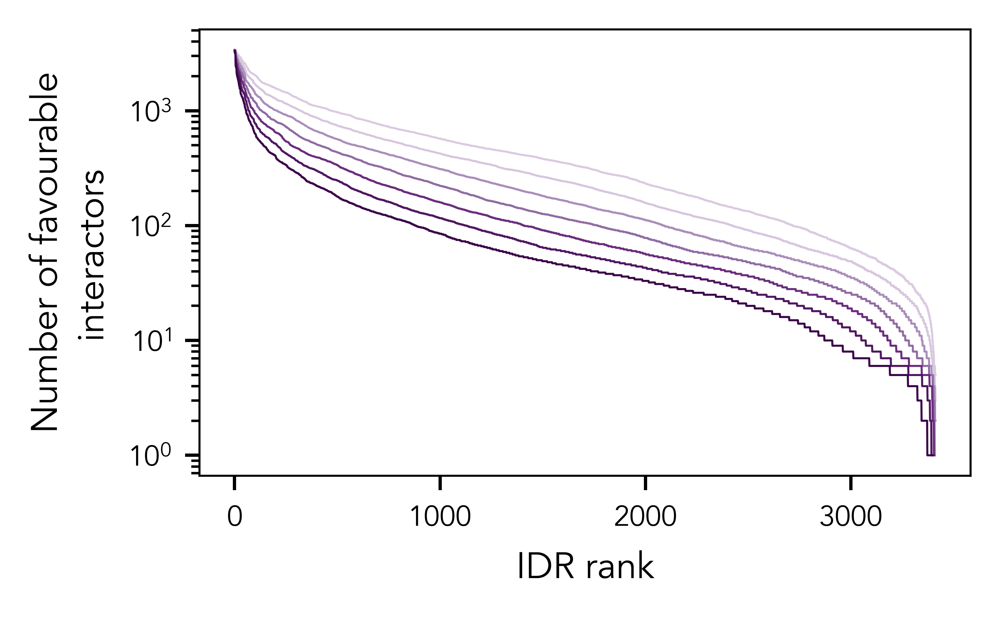

In [8]:
fig = plt.figure(figsize=(3.5, 2.2), dpi=450)
ax = plt.gca()

colors = {}
colors[-3] = '#3A0448'
colors[-2.5] = '#4F1760'
colors[-2] = '#6B2D7D'
colors[-1.5] = '#906CA2'
colors[-1] = '#A98EBB'
colors[-0.5] = '#D7C6DE'
colors[0] = '#DBCAE1'


for t in thresh:
    counts = list(all_idr_interaction_count[t].values())
    
    plt.plot(counts, lw=0.5, color=colors[t])

plt.ylabel('Number of favourable\ninteractors',fontsize=9)
plt.xlabel('IDR rank',fontsize=9)
plt.yticks(fontsize=7)
plt.xticks(fontsize=7)

plt.yscale('log')
plt.tight_layout()
plt.savefig(f'out_figures/interactome_zoomed_out_{mode}.pdf')
#plt.xlim([-10,len(counts)])
    

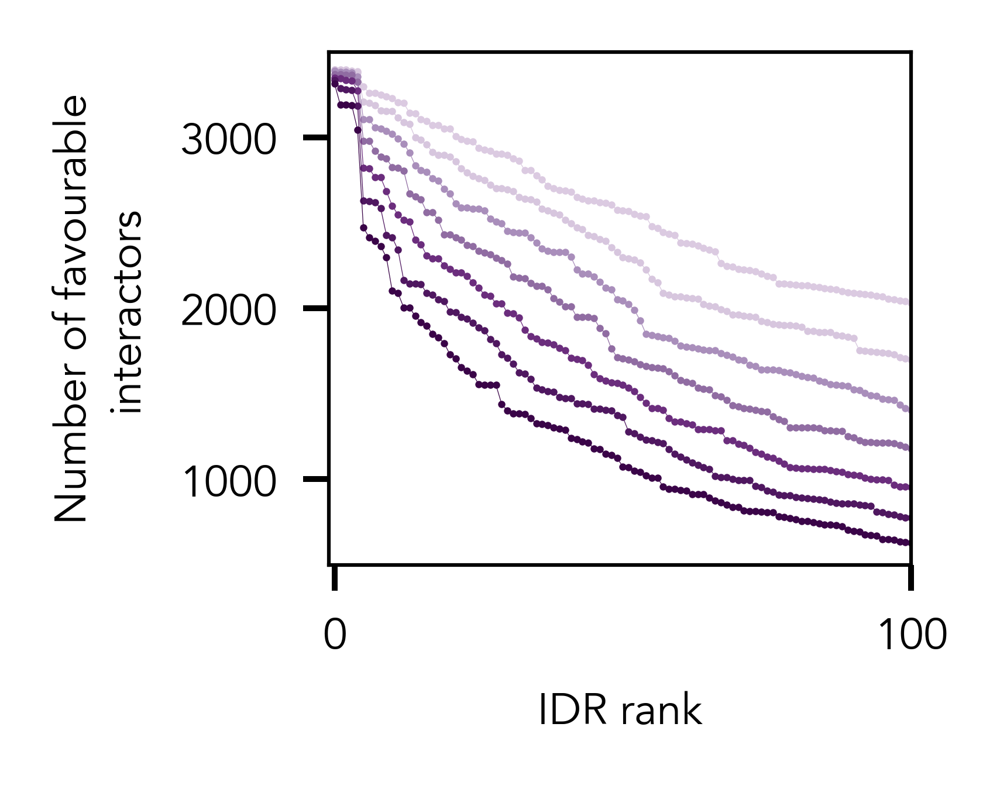

In [9]:
fig = plt.figure(figsize=(2, 1.6), dpi=450)
ax = plt.gca()

colors = {}
colors[-3] = '#3A0448'
colors[-2.5] = '#4F1760'
colors[-2] = '#6B2D7D'
colors[-1.5] = '#906CA2'
colors[-1] = '#A98EBB'
colors[-0.5] = '#D7C6DE'
colors[0] = '#DBCAE1'
for t in thresh:
    counts = list(all_idr_interaction_count[t].values())    
    plt.plot(counts, '.-',lw=0.1, ms=2, mew=0, color=colors[t])

plt.ylabel('Number of favourable\ninteractors',fontsize=6)
plt.xlabel('IDR rank',fontsize=6)
plt.yticks(fontsize=6)
plt.xticks(fontsize=6)
plt.xlim([-1,100])
plt.ylim([500,3500])
plt.tight_layout()
plt.savefig(f'out_figures/interactome_zoomed_in_{mode}.pdf')
    

In [10]:
top_100_unique_idrs = []
for i in list(all_attractive_interactions[-3].keys())[0:100]:
    top_100_unique_idrs.append([i, i.split('_')[0]])

# Print out promiscous IDRs
Prints some of top 100 most promiscous IDRs, including IDR sequence and the associated protein name

In [11]:
for entry in top_100_unique_idrs:
    print(name2domain[entry[0]].protein.name)
    Protein(name2domain[entry[0]].sequence).show_sequence(blocksize=80)
    

sp|Q1KMD3|HNRL2_HUMAN Heterogeneous nuclear ribonucleoprotein U-like protein 2 OS=Homo sapiens OX=9606 GN=HNRNPUL2 PE=1 SV=1


sp|A0A3B3IU46|RMACL_HUMAN RNA guanine-N7 methyltransferase-activating subunit-like protein OS=Homo sapiens OX=9606 GN=RAMACL PE=3 SV=1


sp|O14979|HNRDL_HUMAN Heterogeneous nuclear ribonucleoprotein D-like OS=Homo sapiens OX=9606 GN=HNRNPDL PE=1 SV=3


sp|Q9BTL3|RAMAC_HUMAN RNA guanine-N7 methyltransferase activating subunit OS=Homo sapiens OX=9606 GN=RAMAC PE=1 SV=1


sp|Q99729|ROAA_HUMAN Heterogeneous nuclear ribonucleoprotein A/B OS=Homo sapiens OX=9606 GN=HNRNPAB PE=1 SV=2


sp|Q7Z429|LFG1_HUMAN Protein lifeguard 1 OS=Homo sapiens OX=9606 GN=GRINA PE=1 SV=1


sp|Q17RF5|ODAPH_HUMAN Odontogenesis associated phosphoprotein OS=Homo sapiens OX=9606 GN=ODAPH PE=1 SV=1


sp|Q9P2E3|ZNFX1_HUMAN NFX1-type zinc finger-containing protein 1 OS=Homo sapiens OX=9606 GN=ZNFX1 PE=1 SV=2


sp|O75319|DUS11_HUMAN RNA/RNP complex-1-interacting phosphatase OS=Homo sapiens OX=9606 GN=DUSP11 PE=1 SV=3


sp|P49760|CLK2_HUMAN Dual specificity protein kinase CLK2 OS=Homo sapiens OX=9606 GN=CLK2 PE=1 SV=1


sp|O96002|CX001_HUMAN Putative transmembrane protein CXorf1 OS=Homo sapiens OX=9606 GN=CXorf1 PE=5 SV=1


sp|P62995|TRA2B_HUMAN Transformer-2 protein homolog beta OS=Homo sapiens OX=9606 GN=TRA2B PE=1 SV=1


sp|A6NHP3|SPE2B_HUMAN Speedy protein E2B OS=Homo sapiens OX=9606 GN=SPDYE2B PE=3 SV=2


sp|Q495Y8|SPDE2_HUMAN Speedy protein E2 OS=Homo sapiens OX=9606 GN=SPDYE2 PE=1 SV=2


sp|P04554|PRM2_HUMAN Protamine-2 OS=Homo sapiens OX=9606 GN=PRM2 PE=1 SV=3


sp|P0CI01|SPDE6_HUMAN Speedy protein E6 OS=Homo sapiens OX=9606 GN=SPDYE6 PE=1 SV=2


sp|Q7Z6E9|RBBP6_HUMAN E3 ubiquitin-protein ligase RBBP6 OS=Homo sapiens OX=9606 GN=RBBP6 PE=1 SV=1


sp|Q8WV24|PHLA1_HUMAN Pleckstrin homology-like domain family A member 1 OS=Homo sapiens OX=9606 GN=PHLDA1 PE=1 SV=4


sp|A0A494C086|SPD21_HUMAN Putative speedy protein E21 OS=Homo sapiens OX=9606 GN=SPDYE21 PE=5 SV=1


sp|Q9BXP5|SRRT_HUMAN Serrate RNA effector molecule homolog OS=Homo sapiens OX=9606 GN=SRRT PE=1 SV=1


sp|Q8NFV5|SPDE1_HUMAN Speedy protein E1 OS=Homo sapiens OX=9606 GN=SPDYE1 PE=2 SV=3


sp|A6NIY4|SPDE5_HUMAN Speedy protein E5 OS=Homo sapiens OX=9606 GN=SPDYE5 PE=3 SV=3


sp|Q96BY9|SARAF_HUMAN Store-operated calcium entry-associated regulatory factor OS=Homo sapiens OX=9606 GN=SARAF PE=1 SV=1


sp|Q9HAZ1|CLK4_HUMAN Dual specificity protein kinase CLK4 OS=Homo sapiens OX=9606 GN=CLK4 PE=1 SV=1


sp|Q8IVE0|CROL2_HUMAN Putative ciliary rootlet coiled-coil protein-like 2 protein OS=Homo sapiens OX=9606 GN=CROCCP3 PE=5 SV=1


sp|Q3LHN0|KR251_HUMAN Keratin-associated protein 25-1 OS=Homo sapiens OX=9606 GN=KRTAP25-1 PE=3 SV=1


sp|Q99942|RNF5_HUMAN E3 ubiquitin-protein ligase RNF5 OS=Homo sapiens OX=9606 GN=RNF5 PE=1 SV=1


sp|Q9H5F2|CFA68_HUMAN Cilia- and flagella-associated protein 68 OS=Homo sapiens OX=9606 GN=CFAP68 PE=1 SV=1


sp|A0A2R8Y4L2|RA1L3_HUMAN Heterogeneous nuclear ribonucleoprotein A1-like 3 OS=Homo sapiens OX=9606 GN=HNRNPA1L3 PE=4 SV=2


sp|P49759|CLK1_HUMAN Dual specificity protein kinase CLK1 OS=Homo sapiens OX=9606 GN=CLK1 PE=1 SV=2


sp|Q08211|DHX9_HUMAN ATP-dependent RNA helicase A OS=Homo sapiens OX=9606 GN=DHX9 PE=1 SV=4


sp|Q15696|U2AFM_HUMAN U2 small nuclear ribonucleoprotein auxiliary factor 35 kDa subunit-related protein 2 OS=Homo sapiens OX=9606 GN=ZRSR2 PE=1 SV=2


sp|Q32P51|RA1L2_HUMAN Heterogeneous nuclear ribonucleoprotein A1-like 2 OS=Homo sapiens OX=9606 GN=HNRNPA1L2 PE=2 SV=2


sp|Q15695|U2AFL_HUMAN U2 small nuclear ribonucleoprotein auxiliary factor 35 kDa subunit-related protein 1 OS=Homo sapiens OX=9606 GN=ZRSR2P1 PE=1 SV=2


sp|Q8IW03|SIAH3_HUMAN Seven in absentia homolog 3 OS=Homo sapiens OX=9606 GN=SIAH3 PE=1 SV=3


sp|P62995|TRA2B_HUMAN Transformer-2 protein homolog beta OS=Homo sapiens OX=9606 GN=TRA2B PE=1 SV=1


sp|Q01130|SRSF2_HUMAN Serine/arginine-rich splicing factor 2 OS=Homo sapiens OX=9606 GN=SRSF2 PE=1 SV=4


sp|Q92504|S39A7_HUMAN Zinc transporter SLC39A7 OS=Homo sapiens OX=9606 GN=SLC39A7 PE=1 SV=2


sp|Q5T742|ZFAS1_HUMAN Uncharacterized protein ZNF22-AS1 OS=Homo sapiens OX=9606 GN=ZNF22-AS1 PE=5 SV=3


sp|Q13595|TRA2A_HUMAN Transformer-2 protein homolog alpha OS=Homo sapiens OX=9606 GN=TRA2A PE=1 SV=1


sp|Q9NQ29|LUC7L_HUMAN Putative RNA-binding protein Luc7-like 1 OS=Homo sapiens OX=9606 GN=LUC7L PE=1 SV=1


sp|Q52LJ0|FA98B_HUMAN Protein FAM98B OS=Homo sapiens OX=9606 GN=FAM98B PE=1 SV=2


sp|Q8TE60|ATS18_HUMAN A disintegrin and metalloproteinase with thrombospondin motifs 18 OS=Homo sapiens OX=9606 GN=ADAMTS18 PE=1 SV=3


sp|Q8N7R0|NANG2_HUMAN Putative homeobox protein NANOG2 OS=Homo sapiens OX=9606 GN=NANOGP1 PE=5 SV=1


sp|Q8N2S1|LTBP4_HUMAN Latent-transforming growth factor beta-binding protein 4 OS=Homo sapiens OX=9606 GN=LTBP4 PE=1 SV=2


sp|Q9NWZ8|GEMI8_HUMAN Gem-associated protein 8 OS=Homo sapiens OX=9606 GN=GEMIN8 PE=1 SV=1


sp|Q9UBS3|DNJB9_HUMAN DnaJ homolog subfamily B member 9 OS=Homo sapiens OX=9606 GN=DNAJB9 PE=1 SV=1


sp|Q3LI67|KRA63_HUMAN Keratin-associated protein 6-3 OS=Homo sapiens OX=9606 GN=KRTAP6-3 PE=3 SV=4


sp|Q96A61|TRI52_HUMAN E3 ubiquitin-protein ligase TRIM52 OS=Homo sapiens OX=9606 GN=TRIM52 PE=1 SV=1


sp|Q99973|TEP1_HUMAN Telomerase protein component 1 OS=Homo sapiens OX=9606 GN=TEP1 PE=1 SV=2


sp|Q86UT6|NLRX1_HUMAN NLR family member X1 OS=Homo sapiens OX=9606 GN=NLRX1 PE=1 SV=1


sp|P22083|FUT4_HUMAN Alpha-(1,3)-fucosyltransferase 4 OS=Homo sapiens OX=9606 GN=FUT4 PE=1 SV=3


sp|Q8NAV1|PR38A_HUMAN Pre-mRNA-splicing factor 38A OS=Homo sapiens OX=9606 GN=PRPF38A PE=1 SV=1


sp|Q86U02|CN165_HUMAN Putative uncharacterized protein encoded by LINC00596 OS=Homo sapiens OX=9606 GN=LINC00596 PE=5 SV=1


sp|O95178|NDUB2_HUMAN NADH dehydrogenase [ubiquinone] 1 beta subcomplex subunit 2, mitochondrial OS=Homo sapiens OX=9606 GN=NDUFB2 PE=1 SV=1


sp|O95835|LATS1_HUMAN Serine/threonine-protein kinase LATS1 OS=Homo sapiens OX=9606 GN=LATS1 PE=1 SV=1


sp|Q96I24|FUBP3_HUMAN Far upstream element-binding protein 3 OS=Homo sapiens OX=9606 GN=FUBP3 PE=1 SV=2


sp|Q13875|MOBP_HUMAN Myelin-associated oligodendrocyte basic protein OS=Homo sapiens OX=9606 GN=MOBP PE=1 SV=2


sp|Q8WV44|TRI41_HUMAN E3 ubiquitin-protein ligase TRIM41 OS=Homo sapiens OX=9606 GN=TRIM41 PE=1 SV=3


sp|Q92845|KIFA3_HUMAN Kinesin-associated protein 3 OS=Homo sapiens OX=9606 GN=KIFAP3 PE=1 SV=2


sp|A6NDX5|ZN840_HUMAN Putative zinc finger protein 840 OS=Homo sapiens OX=9606 GN=ZNF840P PE=5 SV=5


sp|Q8TBR5|CSAS1_HUMAN Putative uncharacterized protein CIRBP-AS1 OS=Homo sapiens OX=9606 GN=CIRBP-AS1 PE=5 SV=1


sp|Q9Y3Y2|CHTOP_HUMAN Chromatin target of PRMT1 protein OS=Homo sapiens OX=9606 GN=CHTOP PE=1 SV=2


sp|O75200|NPIB7_HUMAN Nuclear pore complex-interacting protein family member B7 OS=Homo sapiens OX=9606 GN=NPIPB7 PE=3 SV=3


sp|Q8N8D9|IRAS1_HUMAN Uncharacterized protein IRF1-AS1 OS=Homo sapiens OX=9606 GN=IRF1-AS1 PE=1 SV=2


sp|Q14011|CIRBP_HUMAN Cold-inducible RNA-binding protein OS=Homo sapiens OX=9606 GN=CIRBP PE=1 SV=1


sp|Q9Y4M8|CH071_HUMAN Putative uncharacterized protein encoded by LINC00588 OS=Homo sapiens OX=9606 GN=LINC00588 PE=5 SV=1


sp|Q9BTT0|AN32E_HUMAN Acidic leucine-rich nuclear phosphoprotein 32 family member E OS=Homo sapiens OX=9606 GN=ANP32E PE=1 SV=1


sp|Q9H8V8|YD018_HUMAN Putative uncharacterized protein FLJ13197 OS=Homo sapiens OX=9606 PE=5 SV=1


sp|Q8NA77|TEX19_HUMAN Testis-expressed protein 19 OS=Homo sapiens OX=9606 GN=TEX19 PE=1 SV=1


sp|Q9NV39|PRR34_HUMAN Proline-rich protein 34 OS=Homo sapiens OX=9606 GN=PRR34 PE=1 SV=1


sp|P59020|DSCR9_HUMAN Down syndrome critical region protein 9 OS=Homo sapiens OX=9606 GN=DSCR9 PE=2 SV=1


sp|P60006|APC15_HUMAN Anaphase-promoting complex subunit 15 OS=Homo sapiens OX=9606 GN=ANAPC15 PE=1 SV=1


sp|P59051|BRAS2_HUMAN Putative uncharacterized protein encoded by BRWD1-AS2 OS=Homo sapiens OX=9606 GN=BRWD1-AS2 PE=5 SV=1


sp|Q92688|AN32B_HUMAN Acidic leucine-rich nuclear phosphoprotein 32 family member B OS=Homo sapiens OX=9606 GN=ANP32B PE=1 SV=1


sp|Q99954|SMR3A_HUMAN Submaxillary gland androgen-regulated protein 3A OS=Homo sapiens OX=9606 GN=SMR3A PE=1 SV=2


sp|Q8N726|ARF_HUMAN Tumor suppressor ARF OS=Homo sapiens OX=9606 GN=CDKN2A PE=1 SV=2


sp|P39687|AN32A_HUMAN Acidic leucine-rich nuclear phosphoprotein 32 family member A OS=Homo sapiens OX=9606 GN=ANP32A PE=1 SV=1


sp|P98175|RBM10_HUMAN RNA-binding protein 10 OS=Homo sapiens OX=9606 GN=RBM10 PE=1 SV=3


sp|A2AJT9|BCLA3_HUMAN BCLAF1 and THRAP3 family member 3 OS=Homo sapiens OX=9606 GN=BCLAF3 PE=1 SV=1


sp|O60313|OPA1_HUMAN Dynamin-like 120 kDa protein, mitochondrial OS=Homo sapiens OX=9606 GN=OPA1 PE=1 SV=3


sp|Q6RFH8|DUX4C_HUMAN Double homeobox protein 4C OS=Homo sapiens OX=9606 GN=DUX4L9 PE=1 SV=1


sp|Q96AC6|KIFC2_HUMAN Kinesin-like protein KIFC2 OS=Homo sapiens OX=9606 GN=KIFC2 PE=2 SV=1


sp|Q14498|RBM39_HUMAN RNA-binding protein 39 OS=Homo sapiens OX=9606 GN=RBM39 PE=1 SV=2


sp|Q9Y4B6|DCAF1_HUMAN DDB1- and CUL4-associated factor 1 OS=Homo sapiens OX=9606 GN=DCAF1 PE=1 SV=3


sp|P61978|HNRPK_HUMAN Heterogeneous nuclear ribonucleoprotein K OS=Homo sapiens OX=9606 GN=HNRNPK PE=1 SV=1


sp|A6NFI3|ZN316_HUMAN Zinc finger protein 316 OS=Homo sapiens OX=9606 GN=ZNF316 PE=1 SV=1


sp|Q08E93|F27E3_HUMAN Protein FAM27E3 OS=Homo sapiens OX=9606 GN=FAM27E3 PE=1 SV=1


sp|Q9HBX3|SNIT1_HUMAN Uncharacterized protein encoded by SND1-IT1 OS=Homo sapiens OX=9606 GN=SND1-IT1 PE=4 SV=1


sp|Q5JXM2|MET24_HUMAN Probable methyltransferase-like protein 24 OS=Homo sapiens OX=9606 GN=METTL24 PE=2 SV=1


sp|Q6ZV60|YL023_HUMAN Putative uncharacterized protein encoded by LINC00173 OS=Homo sapiens OX=9606 GN=LINC00173 PE=5 SV=1


sp|Q05952|STP2_HUMAN Nuclear transition protein 2 OS=Homo sapiens OX=9606 GN=TNP2 PE=1 SV=1


sp|Q8TAI1|TYMOS_HUMAN TYMS opposite strand protein OS=Homo sapiens OX=9606 GN=TYMSOS PE=5 SV=2


sp|Q86YV0|RASL3_HUMAN RAS protein activator like-3 OS=Homo sapiens OX=9606 GN=RASAL3 PE=1 SV=2


sp|Q96F63|CCD97_HUMAN Coiled-coil domain-containing protein 97 OS=Homo sapiens OX=9606 GN=CCDC97 PE=1 SV=1


sp|Q01105|SET_HUMAN Protein SET OS=Homo sapiens OX=9606 GN=SET PE=1 SV=3


sp|Q96DX7|TRI44_HUMAN Tripartite motif-containing protein 44 OS=Homo sapiens OX=9606 GN=TRIM44 PE=1 SV=1


sp|P55265|DSRAD_HUMAN Double-stranded RNA-specific adenosine deaminase OS=Homo sapiens OX=9606 GN=ADAR PE=1 SV=4


sp|Q9H7B7|CG069_HUMAN Putative uncharacterized protein PKD1L1-AS1 OS=Homo sapiens OX=9606 GN=PKD1L1-AS1 PE=5 SV=3


sp|Q9NNZ3|DNJC4_HUMAN DnaJ homolog subfamily C member 4 OS=Homo sapiens OX=9606 GN=DNAJC4 PE=1 SV=1


In [12]:
# Compute homotypic epsilons for those top 100, and then rank where the homotypic epsilon falls across the 
# distribution of heterotypic epsilon scores already computed

ranked_attractive_top_100 = {}
for i in top_100_unique_idrs:
    ordered_vals = np.array(sorted(list(cross_interaction[i[0]].values())))
    attractive_vals = ordered_vals[ordered_vals < 0]
    ranked_attractive_top_100[i[0]] = attractive_vals

homo_vs_hetero_ranked_top_100 = {}
self_attractive_top_100 = {}

for i in ranked_attractive_top_100:
    if mode == 'mpipi':
        self_interact = mf.epsilon(name2seq[i],name2seq[i])
    elif mode == 'calvados':
        self_interact = cf.epsilon(name2seq[i],name2seq[i])
    self_attractive_top_100[i] = self_interact
    homo_vs_hetero_ranked_top_100[i] = round(100*np.sum(self_interact < ranked_attractive_top_100[i])/len(ranked_attractive_top_100[i]),1)
    

### Print out proteins where homotypic is stronger than 95 of all heterotypic
Basically these are proteins that are mostly more sticky for themselves than anything else...

In [13]:
for i in homo_vs_hetero_ranked_top_100:
    if homo_vs_hetero_ranked_top_100[i] > 95:
        print(Protein(name2seq[i]).show_sequence())
        print(Protein(name2seq[i]).NCPR)

None
0.0915492957746479


None
0.008474576271186446


None
0.03669724770642202


None
0.01694915254237289


None
0.05504587155963303


None
-0.053691275167785234


None
0.08461538461538462


None
0.06306306306306307


None
0.03496503496503497


None
0.049019607843137254


None
0.030000000000000013


None
0.026666666666666672


None
0.04379562043795619


None
0.09302325581395349


None
0.04285714285714286


None
0.06015037593984962


None
-0.045454545454545456


None
-0.022900763358778622


None
-0.007246376811594207


None
0.00909090909090909


None
0.028571428571428567


None
-0.017094017094017096


None
-0.0380952380952381


None
0.01342281879194631


None
-0.007936507936507936


None
0.03731343283582089


None
0.022388059701492533


### Print out proteins where homotypic is stronger than just 1 of all heterotypic
Basically these are proteins that are effectively obligatory heterotypic interactors

In [14]:
for i in homo_vs_hetero_ranked_top_100:
    if homo_vs_hetero_ranked_top_100[i] < 1:
        print(Protein(name2seq[i]).show_sequence())
        print(Protein(name2seq[i]).NCPR)

None
0.19727891156462582


None
0.18309859154929575


None
0.18309859154929575


None
0.2549019607843137


None
0.21008403361344535


None
0.24786324786324787


None
0.18181818181818182


None
0.22413793103448276


None
0.108843537414966


None
0.19819819819819823


None
0.10666666666666663


None
0.2835820895522388


None
0.23809523809523808


None
0.05714285714285714


None
0.22881355932203387


None
0.33587786259541985


None
0.211864406779661


None
0.23880597014925373


None
-0.381679389312977


None
0.1929824561403509


None
0.1851851851851852


None
0.22807017543859645


None
-0.4538461538461539


None
0.11403508771929824


None
0.1559633027522936


None
0.2440944881889764


None
0.11678832116788321


None
-0.5867768595041323


None
-0.20535714285714285


None
0.12318840579710144


None
-0.3305785123966942


None
0.1517241379310345


None
-0.6601941747572815


None
0.16666666666666666


None
-0.5742574257425743


None
-0.1208053691275168


None
0.14285714285714285


None
0.16964285714285712


None
0.16541353383458646


None
0.25517241379310346


None
-0.5478260869565218


None
-0.1958041958041958


None
0.14159292035398233


None
0.17117117117117117


None
0.17391304347826086


None
0.1951219512195122


None
0.14189189189189189


None
-0.2328767123287671


None
-0.3458646616541353


None
-0.504950495049505


In [15]:
median_ranked_attractive_top_100 = []
self_ranked_attractive_top_100 = []
for k in ranked_attractive_top_100:
    median_ranked_attractive_top_100.append(np.median(ranked_attractive_top_100[k]))
    self_ranked_attractive_top_100.append(self_attractive_top_100[k])

list_ranked_attractive_top_100 = list(ranked_attractive_top_100.keys())

sp|Q1KMD3|HNRL2_HUMAN Heterogeneous nuclear ribonucleoprotein U-like protein 2 OS=Homo sapiens OX=9606 GN=HNRNPUL2 PE=1 SV=1
sp|A0A3B3IU46|RMACL_HUMAN RNA guanine-N7 methyltransferase-activating subunit-like protein OS=Homo sapiens OX=9606 GN=RAMACL PE=3 SV=1
sp|O14979|HNRDL_HUMAN Heterogeneous nuclear ribonucleoprotein D-like OS=Homo sapiens OX=9606 GN=HNRNPDL PE=1 SV=3
sp|Q9BTL3|RAMAC_HUMAN RNA guanine-N7 methyltransferase activating subunit OS=Homo sapiens OX=9606 GN=RAMAC PE=1 SV=1
sp|Q99729|ROAA_HUMAN Heterogeneous nuclear ribonucleoprotein A/B OS=Homo sapiens OX=9606 GN=HNRNPAB PE=1 SV=2
sp|Q7Z429|LFG1_HUMAN Protein lifeguard 1 OS=Homo sapiens OX=9606 GN=GRINA PE=1 SV=1
sp|Q17RF5|ODAPH_HUMAN Odontogenesis associated phosphoprotein OS=Homo sapiens OX=9606 GN=ODAPH PE=1 SV=1
sp|Q9P2E3|ZNFX1_HUMAN NFX1-type zinc finger-containing protein 1 OS=Homo sapiens OX=9606 GN=ZNFX1 PE=1 SV=2
sp|O75319|DUS11_HUMAN RNA/RNP complex-1-interacting phosphatase OS=Homo sapiens OX=9606 GN=DUSP11 PE=1

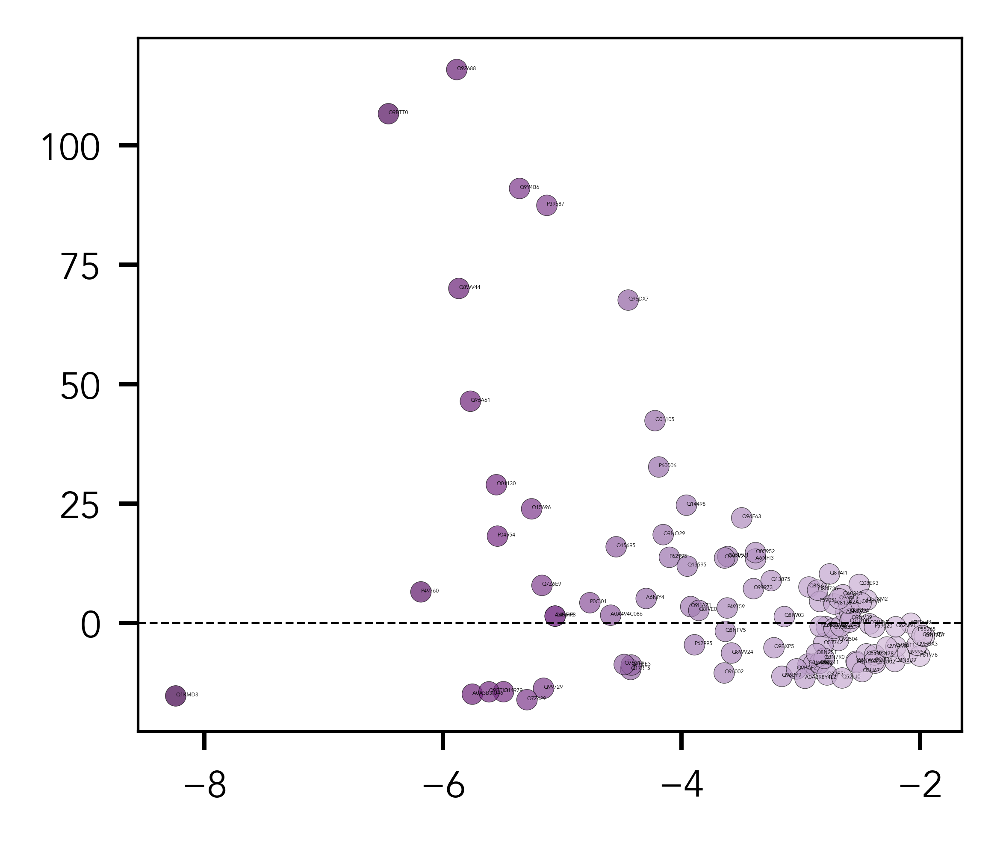

In [16]:
fig = plt.figure(figsize=(2.7, 2.3), dpi=450)
ax = plt.gca()

show_text = True

if show_text:
    for i in range(len(ranked_attractive_top_100)):
        print(HP.protein(list_ranked_attractive_top_100[i].split('_')[0]).name)
        plt.text( median_ranked_attractive_top_100[i], self_ranked_attractive_top_100[i], list_ranked_attractive_top_100[i].split('_')[0], fontsize=0.5)

plt.scatter(median_ranked_attractive_top_100, self_ranked_attractive_top_100, 
            c=median_ranked_attractive_top_100, 
            cmap='PRGn', vmin=-7, vmax=7, 
            s=15, alpha=0.7,
            linewidth=0.1, edgecolor='k')
ax.axhline(0,color='k',lw=0.4, ls='--')
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.tight_layout()

if show_text:
    plt.savefig(f'out_figures/homo_vs_heter_{mode}_with_text.pdf')
else:
    plt.savefig(f'out_figures/homo_vs_heter_{mode}.pdf')


## Setup for matrix clustering

In [17]:
all_cross_interactions = []
attractive = 0
repulsive = 0
for k1 in cross_interaction:
    tmp = []
    for k2 in cross_interaction:
        tmp.append(cross_interaction[k1][k2])
        if cross_interaction[k1][k2] < 0:
            attractive = attractive+1
        else:
            repulsive = repulsive + 1
    all_cross_interactions.append(tmp)
all_cross_interactions = np.array(all_cross_interactions)

In [18]:
print(f'Percentage of pairs that are attractive: {round(100*attractive/(repulsive+attractive),2)}%')
print(f'Percentage of pairs that are repulsive: {round(100*repulsive/(repulsive+attractive),2)}%')

Percentage of pairs that are attractive: 14.71%
Percentage of pairs that are repulsive: 85.29%


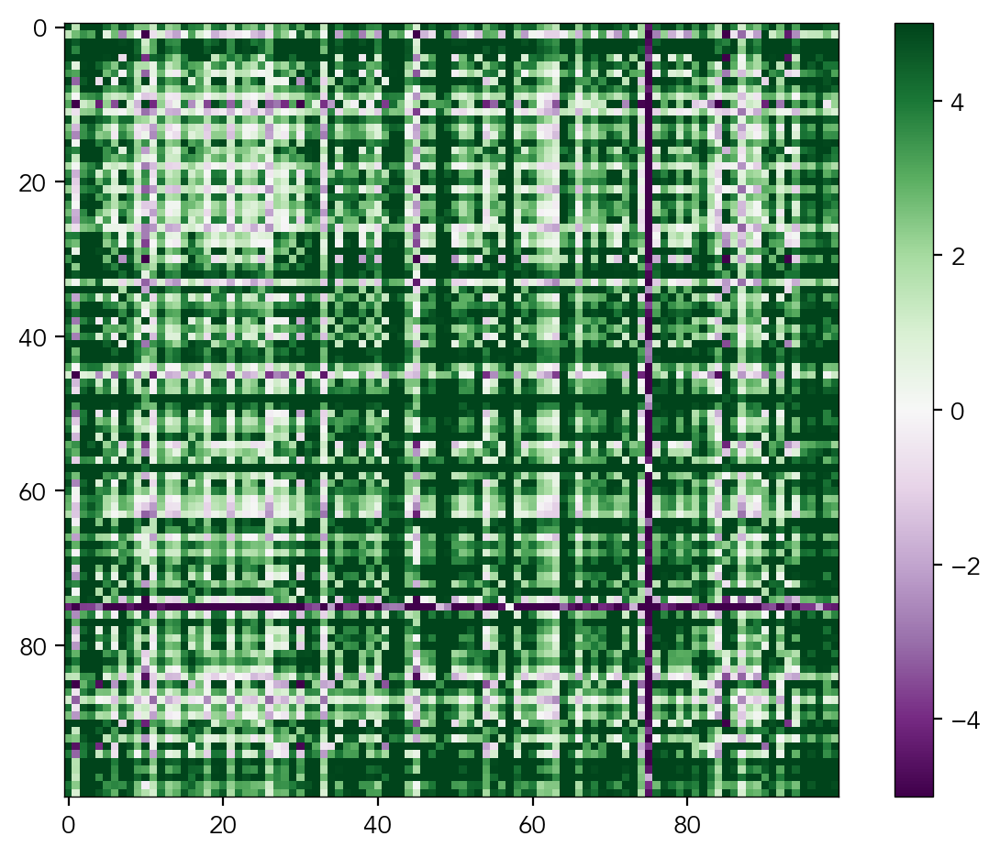

In [19]:
if mode == 'calvados':
    plt.imshow(all_cross_interactions[0:100,0:100], vmin=-15, vmax=15,cmap='PRGn',interpolation='None')
elif mode == 'mpipi':
    plt.imshow(all_cross_interactions[0:100,0:100], vmin=-5, vmax=5,cmap='PRGn',interpolation='None')
plt.colorbar()
plt.tight_layout()
plt.savefig(f'out_figures/smol_matrix_{mode}.pdf')

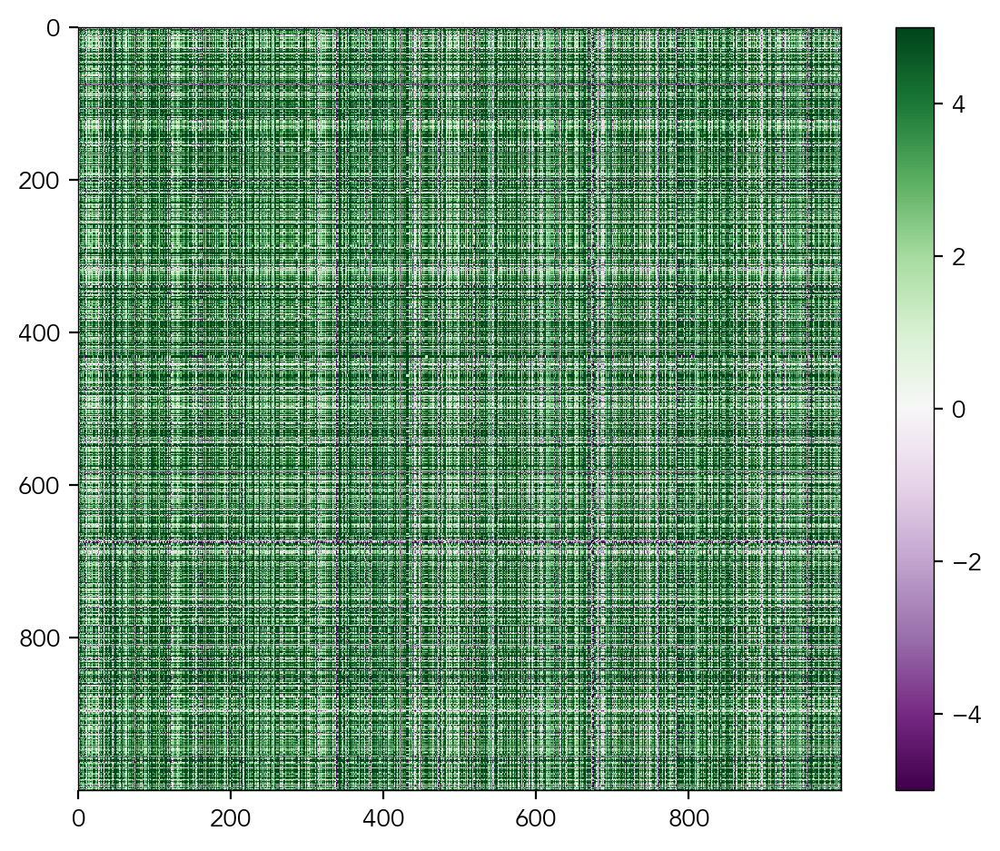

In [20]:
if mode == 'calvados':
    plt.imshow(all_cross_interactions[0:1000,0:1000], vmin=-15, vmax=15,cmap='PRGn',interpolation='None')
elif mode == 'mpipi':
    plt.imshow(all_cross_interactions[0:1000,0:1000], vmin=-5, vmax=5,cmap='PRGn',interpolation='None')

plt.colorbar()
plt.tight_layout()
plt.savefig(f'out_figures/medium_matrix_{mode}.pdf')

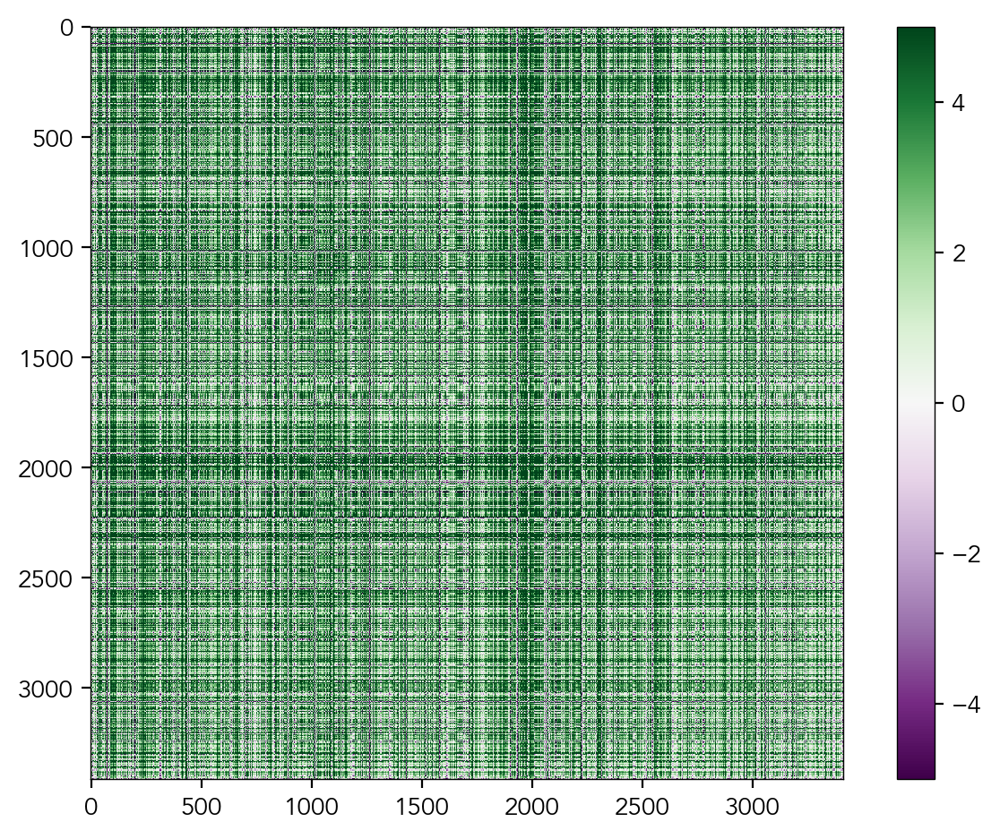

In [21]:
if mode == 'calvados':
    plt.imshow(all_cross_interactions, vmin=-15, vmax=15,cmap='PRGn',interpolation='None')
elif mode == 'mpipi':
    plt.imshow(all_cross_interactions, vmin=-5, vmax=5,cmap='PRGn',interpolation='None')

plt.colorbar()
plt.tight_layout()
plt.savefig(f'out_figures/big_matrix_{mode}.pdf')

## MATRIX CLUSTERING SECTION
The cells below carry out matrix clustering and visualization

In [22]:
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list,fcluster
import matplotlib.patches as mpatches



In [23]:
%%time
# calculate the linkage relationships
# NOTE - this takes ~5 min to run because of the optimal_ordering keyword
row_linkage = linkage(all_cross_interactions, method='ward', optimal_ordering=True)
col_linkage = linkage(all_cross_interactions.T, method='ward',optimal_ordering=True)  # Transpose for column clustering
row_order = leaves_list(row_linkage)
col_order = leaves_list(col_linkage)

CPU times: user 5min 30s, sys: 902 ms, total: 5min 31s
Wall time: 5min 32s


In [24]:
# reorder the matrix based on this set of linkage relationships
reordered_matrix = all_cross_interactions[row_order, :][:, col_order]


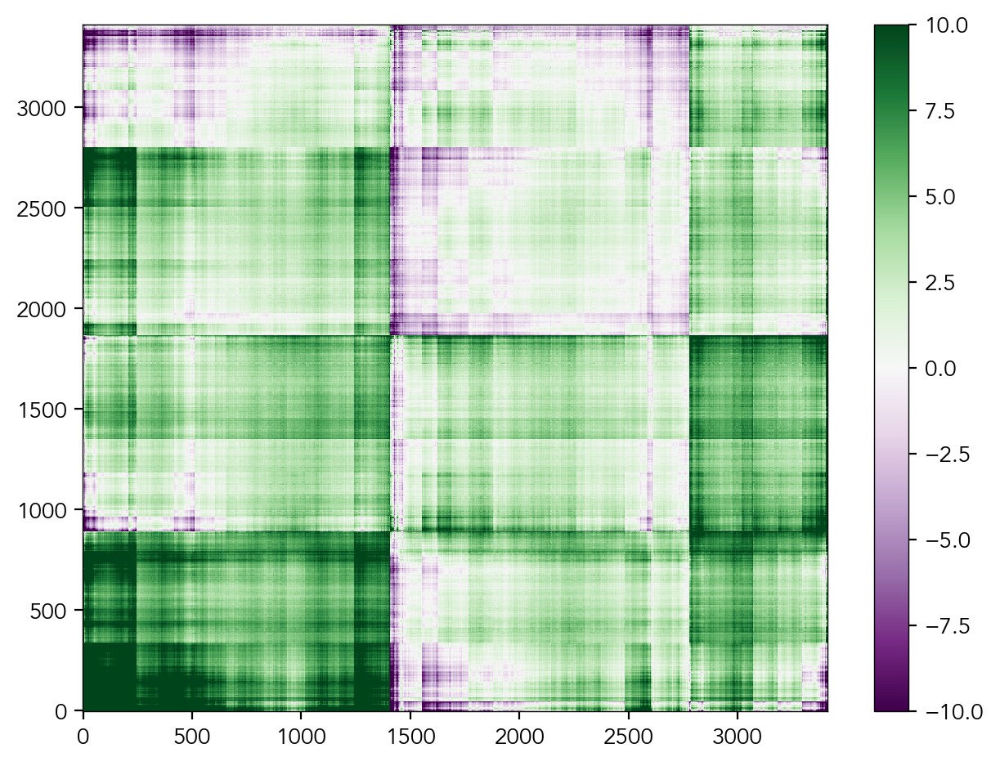

In [25]:
# test-drive simple representation - 
if mode == 'calvados':
    plt.imshow(reordered_matrix, vmin=-25, vmax=25,cmap='PRGn',interpolation='None', aspect='auto', origin='lower')
    plt.colorbar()
    plt.tight_layout()
elif mode == 'mpipi':
    plt.imshow(reordered_matrix, vmin=-10, vmax=10,cmap='PRGn',interpolation='None', aspect='auto', origin='lower')
    plt.colorbar()
    plt.tight_layout()
    

In [26]:
# define the number of clusters (0.5) - so nclusters12 => 24 clusters
nclusters=12

# find nclusters*2 clusters using maxclust
clusters = fcluster(row_linkage, t=nclusters*2, criterion='maxclust')


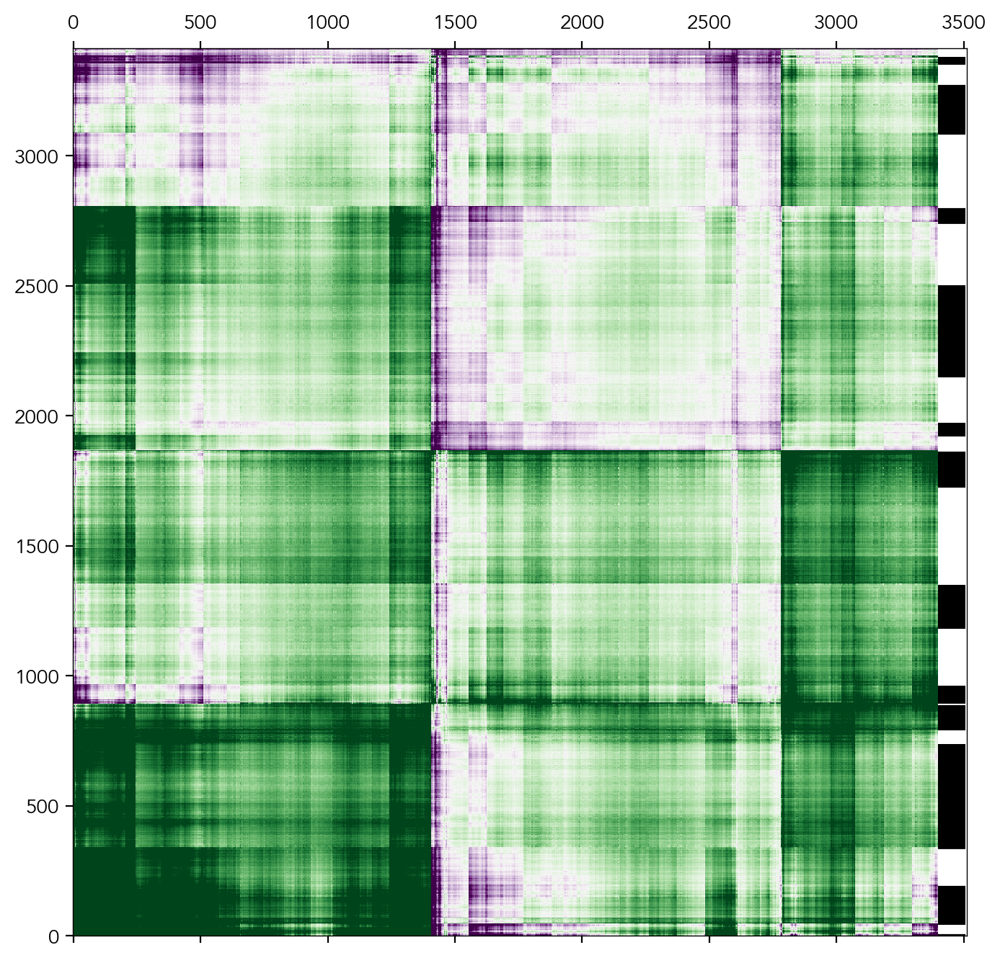

In [27]:
# now plot everything
fig, ax = plt.subplots(figsize=(8, 8))

if mode == 'mpipi':
    cax = ax.matshow(reordered_matrix, aspect='auto', origin='lower', cmap='PRGn', vmin=-8, vmax=8)
elif mode == 'calvados':
    cax = ax.matshow(reordered_matrix, aspect='auto', origin='lower', cmap='PRGn', vmin=-25, vmax=25)

# Add a color bar for the heatmap

# cluster membership sidebar - rather than the chaos of a dendrogram we're gonna alternative white/black to deliniate
# cluster identity

possible_colors = ['k','w']
color_idx = 0

current_cluster = clusters[row_order][0]
current_color = 'k'
color_labels = []
color_labels.append(current_color)

for c in clusters[row_order][1:]:
    if c == current_cluster:
         pass
    else:
        current_cluster = c
        
        if color_idx + 1 == len(possible_colors):
            color_idx = 0
            current_color = possible_colors[color_idx]
        else:
            color_idx = color_idx + 1            
            current_color = possible_colors[color_idx]
        
    color_labels.append(current_color)


#cluster_colors = ['k', 'w']*(nclusters)
#color_labels = [cluster_colors[i-1] for i in clusters[row_order]]  # Match cluster ID to color

for ypos, c in enumerate(color_labels):
    ax.add_patch(mpatches.Rectangle((3400, ypos), 100, 10, color=c, edgecolor=None))

ax.set_xlim(right=reordered_matrix.shape[0]+100)  


plt.savefig(f'out_figures/clustered_chemical_space_{mode}.pdf')

In [28]:
cluster_indices_dict = {}
for index, cluster_id in enumerate(clusters):
    if cluster_id not in cluster_indices_dict:
        cluster_indices_dict[cluster_id] = []
    cluster_indices_dict[cluster_id].append(index)

In [29]:
# define the domains in each cluster (1,2,... from bottom to top)
cluster_domains = {}
for i in range(1, 1+nclusters*2):

    cluster_domains[i] = []
    for idx in cluster_indices_dict[i]:
        cluster_domains[i].append(size_d[idx])


In [30]:
cluster_props = {}
for i in range(1, 1+nclusters*2):
    local_seqs = []
    local_props = []
    for d in cluster_domains[i]:
        local_seqs.append(Protein(d.sequence))

    local_props.append(len(local_seqs))
    local_props.append([round(p.NCPR,4) for p in local_seqs])
    local_props.append([round(p.FCR,4) for p in local_seqs])
    local_props.append([round(p.fraction_aliphatic,4) for p in local_seqs])
    local_props.append([round(p.fraction_aromatic,4) for p in local_seqs])
    local_props.append([round(p.fraction_negative,4) for p in local_seqs])
    local_props.append([round(p.fraction_positive,4) for p in local_seqs])
    local_props.append([round(p.fraction_polar,4) for p in local_seqs])
    local_props.append([round(p.fraction_proline,4) for p in local_seqs])
    #local_props.append([round(p.kappa,4) for p in local_seqs])
    
    cluster_props[i] = [round(np.mean(p),4) for p in local_props]


In [31]:
# len ncpr, fcr, ali, aro, neg, pos, pol, pro kappa 

In [32]:
# write out cluster info

with open(f'../../data/outdata/proteome_wide_condensate/average_cluster_properties_{mode}.csv','w') as fh:
    fh.write('Cluster, Prot. count, NCPR, FCR, f_ali, f_aro, f_neg, f_pos, f_pol, f_pro\n')
    for k in cluster_props:
        fh.write(str(k) + ", " + ", ".join([str(i) for i in cluster_props[k]]) + "\n")
            
    

In [33]:
cluster_to_show = 24
for d in cluster_domains[cluster_to_show]:
    Protein(d.sequence).show_sequence()


In [34]:
cluster_fasta = {}
for i in range(1, 1+nclusters*2):
    for d in cluster_domains[i]:
        name = f"CLUSTER_{i} | {d.protein.name} | START={d.start}  END={d.end}"
        seq = d.sequence
        cluster_fasta[name] = seq
        
protfasta.write_fasta(cluster_fasta, f'clustered_idrs_{mode}.fasta')        


In [35]:
with open('../../data/outdata/proteome_wide_condensate/heterotypic_clusers_{mode}.csv','w') as fh:
    idx = 0
    fh.write(f"index, UniProt ID, name, cluster, idr_start, idr_end, sequence\n")
    for i in range(1, 1+nclusters*2):
        for d in cluster_domains[i]:
            idx = idx + 1
            safename = d.protein.name.replace(',',';')
            fh.write(f"{idx}, {d.protein.unique_ID}, {safename}, {i}, {d.start}, {d.end}, {d.sequence}\n")
            